# Поиск по изображениям

## Загрузка библиотек и файлов

In [ ]:
!pip install -q tensorflow
!pip install -q keras_nlp
!pip install -q transformers
!pip install -q sentence_transformers
!pip install -q spacy
!pip install -q pymystem3

In [ ]:
import os

import warnings
from tqdm import tqdm
from tqdm import notebook
tqdm.pandas()
from PIL import Image
from pathlib import Path

import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from scipy import stats as st

from sklearn.linear_model import LinearRegression
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error
import numpy as np


from sklearn.model_selection import train_test_split, GridSearchCV, GroupShuffleSplit, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.metrics import accuracy_score, log_loss, f1_score, mean_squared_error
from statistics import mode

from pymystem3 import Mystem
import re
import nltk
from sklearn.feature_extraction.text import TfidfVectorizer
import spacy

import torch
import torch.nn as nn
import pickle
import torchvision.models as models
from torch.utils.data import DataLoader, TensorDataset
from torchvision import transforms

from tensorflow import keras
import tensorflow as tf
import keras_nlp
from tensorflow.keras.metrics import RootMeanSquaredError
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from keras.applications.resnet50 import ResNet50, preprocess_input
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Flatten, GlobalAveragePooling2D, Conv2D, MaxPooling2D, BatchNormalization, Reshape, RepeatVector, LSTM, Dropout
from tensorflow.keras.optimizers import Adam
from keras.callbacks import EarlyStopping

import transformers
from transformers import BertModel, BertTokenizer
import sentence_transformers
from sentence_transformers import SentenceTransformer, util
import glob

In [ ]:
# Зададим глобальные переменные

PATH = '/content/to_upload'

SEED = 12345

STOP_WORDS = ['child',
              'boy',
              'girl',
              'baby',
              'teen',
              'teenager',
              'kid',
              'infant',
              'infants',
              'youngsters',
              'youngster',
              'kids',
              'children',
              'boys',
              'girls',
              'babies',
              'teens',
              'teenagers',
              'toddler',
              'toddlers',
              'schoolboy',
              'schoolgirl',
              'pupil',
              'pupils']


In [ ]:
# Загрузим датасет с сервера
!wget -q https://code.s3.yandex.net/datasets/dsplus_integrated_project_4.zip
!unzip -q dsplus_integrated_project_4.zip

In [ ]:
# Загрузим файлы
if os.path.exists(PATH):
    data_train = pd.read_csv(os.path.join(PATH, 'train_dataset.csv'))
    data_crowd = pd.read_csv(os.path.join(PATH, 'CrowdAnnotations.tsv'), sep='\t', names = ['image', 'query_id', 'fraction', 'pros', 'cons'])
    data_expert = pd.read_csv(os.path.join(PATH, 'ExpertAnnotations.tsv'), sep='\t', names = ['image', 'query_id', 'first', 'second', 'third'])
    data_test = pd.read_csv(os.path.join(PATH, 'test_queries.csv'), index_col=[0], sep='|')
    test_image = pd.read_csv(os.path.join(PATH, 'test_images.csv'))
else:
    print('Something is wrong')

В файле **train_dataset.csv** находится информация, необходимая для обучения:

* имя файла изображения
* идентификатор описания
* текст описания

Для одной картинки может быть доступно до 5 описаний.  

Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.  

В папке **train_images** содержатся изображения для тренировки модели.

In [ ]:
data_train.head()

,image,query_id,query_text
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...


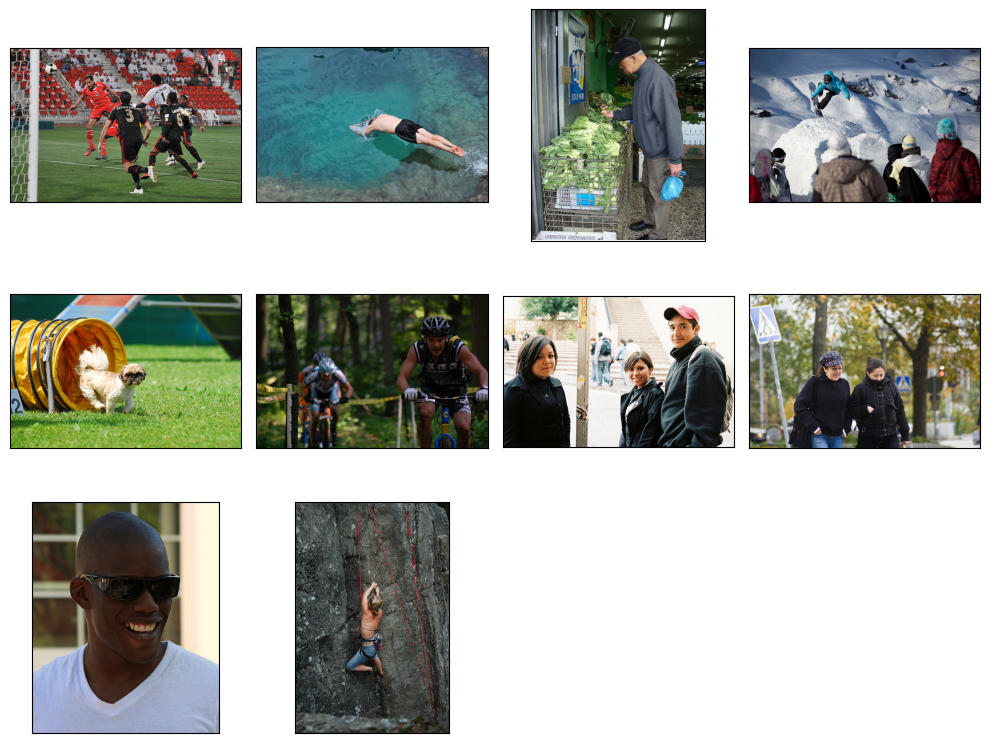

In [ ]:
# Загрузим примеры картинок из датасета data_train

samples_train = list(data_train['image'].sample(10))

fig = plt.figure(figsize=(10,10))
for i in range(10):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(PATH, 'train_images', samples_train[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

In [ ]:
# Посмотрим общую информацию о датасете data_train

data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   image       5822 non-null   object
 1   query_id    5822 non-null   object
 2   query_text  5822 non-null   object
dtypes: object(3)
memory usage: 136.6+ KB


In [ ]:
data_train.describe()

,image,query_id,query_text
count,5822,5822,5822
unique,1000,977,977
top,3364151356_eecd07a23e.jpg,2600867924_cd502fc911.jpg#2,"Two dogs , one brown and white and one black a..."
freq,10,34,34


In [ ]:
data_train.duplicated().sum()

0

В датасете data_train 3 колонки и 5822 строк, пропусков и дублей нет

В файле **CrowdAnnotations.tsv**— данные по соответствию изображения и описания, полученные с помощью краудсорсинга. Номера колонок и соответствующий тип данных:

* Имя файла изображения.  
* Идентификатор описания.  
* Доля людей, подтвердивших, что описание соответствует изображению.  
* Количество человек, подтвердивших, что описание соответствует изображению.  
* Количество человек, подтвердивших, что описание не соответствует изображению.  




In [ ]:
data_crowd.head()

,image,query_id,fraction,pros,cons
0,1056338697_4f7d7ce270.jpg,1056338697_4f7d7ce270.jpg#2,1.0,3,0
1,1056338697_4f7d7ce270.jpg,114051287_dd85625a04.jpg#2,0.0,0,3
2,1056338697_4f7d7ce270.jpg,1427391496_ea512cbe7f.jpg#2,0.0,0,3
3,1056338697_4f7d7ce270.jpg,2073964624_52da3a0fc4.jpg#2,0.0,0,3
4,1056338697_4f7d7ce270.jpg,2083434441_a93bc6306b.jpg#2,0.0,0,3


In [ ]:
data_crowd.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 47830 entries, 0 to 47829
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   image     47830 non-null  object 
 1   query_id  47830 non-null  object 
 2   fraction  47830 non-null  float64
 3   pros      47830 non-null  int64  
 4   cons      47830 non-null  int64  
dtypes: float64(1), int64(2), object(2)
memory usage: 1.8+ MB


In [ ]:
data_crowd.describe()

,fraction,pros,cons
count,47830.000000,47830.000000,47830.000000
mean,0.068786,0.208488,2.820155
std,0.207532,0.628898,0.656676
min,0.000000,0.000000,0.000000
25%,0.000000,0.000000,3.000000
50%,0.000000,0.000000,3.000000
75%,0.000000,0.000000,3.000000
max,1.000000,5.000000,6.000000


In [ ]:
data_crowd.duplicated().sum()

0

В датасете data_crowd 5 колонок и 47830 строк, пропущенных значений и дублей нет

В файле **ExpertAnnotations.tsv** — данные по соответствию изображения и описания, полученные в результате опроса экспертов.

Номера колонок и соответствующий тип данных:

* Имя файла изображения.
* Идентификатор описания.
* 3, 4, 5 — оценки трёх экспертов.
* Эксперты ставят оценки по шкале от 1 до 4, где:

1 — изображение и запрос совершенно не соответствуют друг другу.

2 — запрос содержит элементы описания изображения, но в целом запрос тексту не соответствует.

3 — запрос и текст соответствуют с точностью до некоторых деталей.

4 — запрос и текст соответствуют полностью.  

In [ ]:
data_expert.head()

,image,query_id,first,second,third
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,1,1,1
1,1056338697_4f7d7ce270.jpg,2718495608_d8533e3ac5.jpg#2,1,1,2
2,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,1,1,2
3,1056338697_4f7d7ce270.jpg,3207358897_bfa61fa3c6.jpg#2,1,2,2
4,1056338697_4f7d7ce270.jpg,3286822339_5535af6b93.jpg#2,1,1,2


In [ ]:
data_expert.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 5 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   image     5822 non-null   object
 1   query_id  5822 non-null   object
 2   first     5822 non-null   int64 
 3   second    5822 non-null   int64 
 4   third     5822 non-null   int64 
dtypes: int64(3), object(2)
memory usage: 227.5+ KB


In [ ]:
data_expert.describe()

,first,second,third
count,5822.000000,5822.000000,5822.000000
mean,1.436620,1.624356,1.881999
std,0.787084,0.856222,0.904087
min,1.000000,1.000000,1.000000
25%,1.000000,1.000000,1.000000
50%,1.000000,1.000000,2.000000
75%,2.000000,2.000000,2.000000
max,4.000000,4.000000,4.000000


In [ ]:
data_expert.duplicated().sum()

0

В датасете data_expert 5 колонок и 5822 строк, пропущенных значений и дублей нет

В файле **test_queries.csv** находится информация, необходимая для тестирования:

* идентификатор запроса
* текст запроса и релевантное изображение. Для одной картинки может быть доступно до 5 описаний.
* Идентификатор описания имеет формат <имя файла изображения>#<порядковый номер описания>.

В папке **test_images** содержатся изображения для тестирования модели.

In [ ]:
data_test.head()

,query_id,query_text,image
0,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
1,1177994172_10d143cb8d.jpg#1,Two boys are squirting water guns at each other .,1177994172_10d143cb8d.jpg
2,1177994172_10d143cb8d.jpg#2,Two boys spraying each other with water,1177994172_10d143cb8d.jpg
3,1177994172_10d143cb8d.jpg#3,Two children wearing jeans squirt water at eac...,1177994172_10d143cb8d.jpg
4,1177994172_10d143cb8d.jpg#4,Two young boys are squirting water at each oth...,1177994172_10d143cb8d.jpg


In [ ]:
data_test.info()

<class 'pandas.core.frame.DataFrame'>
Index: 500 entries, 0 to 499
Data columns (total 3 columns):
 #   Column      Non-Null Count  Dtype 
---  ------      --------------  ----- 
 0   query_id    500 non-null    object
 1   query_text  500 non-null    object
 2   image       500 non-null    object
dtypes: object(3)
memory usage: 15.6+ KB


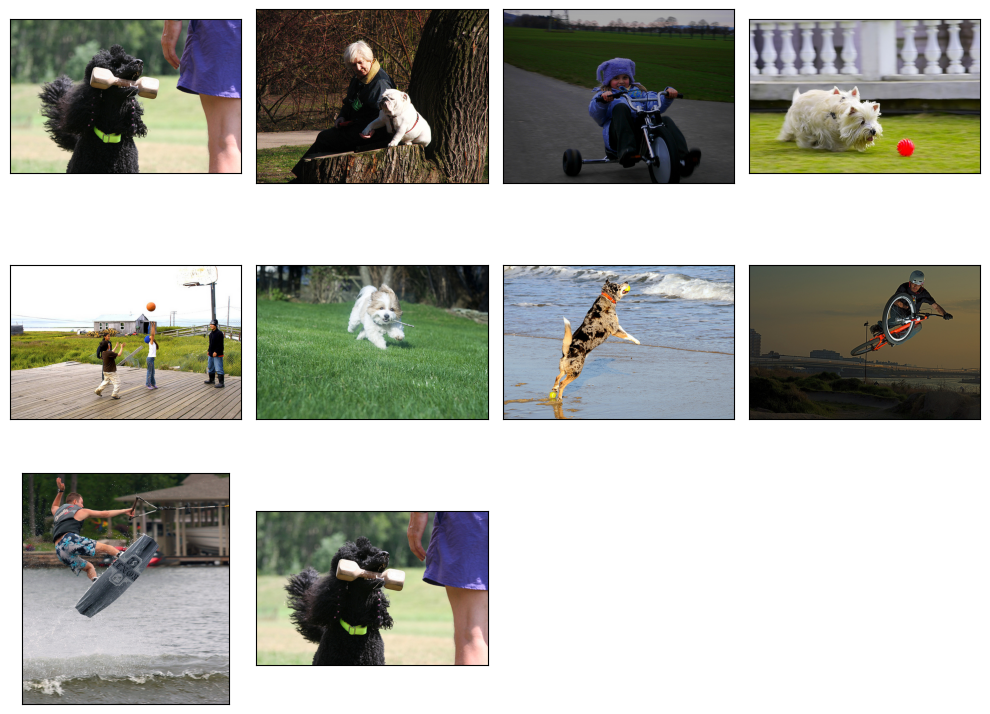

In [ ]:
# Загрузим примеры картинок из data_test

samples_test = list(data_test['image'].sample(10))

fig = plt.figure(figsize=(10,10))
for i in range(10):
    fig.add_subplot(4, 4, i+1)
    image = Image.open(Path(PATH, 'test_images', samples_test[i]))
    plt.imshow(image)
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()

In [ ]:
data_test.describe()

,query_id,query_text,image
count,500,500,500
unique,500,500,100
top,1177994172_10d143cb8d.jpg#0,"Two blonde boys , one in a camouflage shirt an...",1177994172_10d143cb8d.jpg
freq,1,1,5


In [ ]:
data_test.duplicated().sum()

0

В датасете data_test 3 колонки и 500 строк, пропусков и дублей нет.


## Агрегация оценок



Датасет содержит экспертные и краудсорсинговые оценки соответствия текста и изображения. Необходимо провести агрегацию оценок и перевести их значение в диапазон от 0 до 1, т.к. модель должна возвращать на выходе вероятность соответствия изображения тексту.

Будем использовать только оценки экспертов.

Объеденим оценки экспертов. Если есть одинаковые оценки, то будем выбирать наиболее часто встречающуюся оценку (принцип голосование большинства).
Если оценки разные - берем среднюю оценку (сумма трех оценок/3).
Также нам надо привести оценки в диапазон от 0 до 1. Попробуем для этого использовать min-max стандартизатор.

In [ ]:
def get_score(row):
    if row['first'] != row['second'] != row['third']:
        mean_score = (row['first'] + row['second'] + row['third'])/3
        row['agg_score'] = (mean_score - 1)/3
    else:
        score = mode([row['first'], row['second'], row['third']])
        row['agg_score'] = (score - 1)/3
    return row

In [ ]:
data_expert = data_expert.apply(get_score, axis=1)

In [ ]:
# Добавим столбец с агрегированной оценкой экспертов в тренировочный датасет

data_train = data_train.merge(data_expert, on=['image', 'query_id'], how='left')
data_train.head()

,image,query_id,query_text,first,second,third,agg_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.000000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.000000
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,2,2,0.333333
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,4,4,4,1.000000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1,1,1,0.000000


In [ ]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5822 entries, 0 to 5821
Data columns (total 7 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       5822 non-null   object 
 1   query_id    5822 non-null   object 
 2   query_text  5822 non-null   object 
 3   first       5822 non-null   int64  
 4   second      5822 non-null   int64  
 5   third       5822 non-null   int64  
 6   agg_score   5822 non-null   float64
dtypes: float64(1), int64(3), object(3)
memory usage: 318.5+ KB


In [ ]:
data_expert['agg_score'].describe()

count    5822.000000
mean        0.208157
std         0.285431
min         0.000000
25%         0.000000
50%         0.000000
75%         0.333333
max         1.000000
Name: agg_score, dtype: float64

In [ ]:
# Удалим лишние колонки 'first','second', 'third'

data_train = data_train.drop(['first','second', 'third'], axis=1)

In [ ]:
data_train.head()

,image,query_id,query_text,agg_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.333333
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.000000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000


После агрегации оценок получили одну колонку вместо 3х. Итоговый датасет data_train содержит 4 колонки и 5822 строк

## 2. Проверка данных

В некоторых странах, где работает компания, действуют ограничения по обработке изображений: поисковым сервисам и сервисам, предоставляющим возможность поиска, запрещено без разрешения родителей или законных представителей предоставлять любую информацию, в том числе, но не исключительно тексты, изображения, видео и аудио, содержащие описание, изображение или запись голоса детей. Ребёнком считается любой человек, не достигший 16 лет.

В нашем сервисе строго следуют законам стран, в которых работают. Поэтому при попытке посмотреть изображения, запрещённые законодательством, вместо картинок показывается дисклеймер:

> This image is unavailable in your country in compliance with local laws
>

Однако у нас в PoC нет возможности воспользоваться данным функционалом. Поэтому все изображения, которые нарушают данный закон, нужно удалить из обучающей выборки.

В начале исследования мы создали глобальную переменную с перечнем слов, указывающих на лиц до 16 лет.

STOP_WORDS = ['child',
              'boy',
              'girl',
              'baby',
              'teen',
              'teenager',
              'kid',
              'infant',
              'youngster',
              'kids',
              'children',
              'boys',
              'girls',
              'babies',
              'teens',
              'teenagers',
              'youth',
              'young',
              'babe']

In [ ]:
data_train.head(10)

,image,query_id,query_text,agg_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.333333
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,1.000000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.333333
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
8,343218198_1ca90e0734.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000
9,3718964174_cb2dc1615e.jpg,2549968784_39bfbe44f9.jpg#2,A young child is wearing blue goggles and sitt...,0.000000


In [ ]:
# Приведем текст в колонке 'query_text' к нижнему регистру

data_train['query_text'] = data_train['query_text'].str.lower()
data_train.head()

,image,query_id,query_text,agg_score
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.000000
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.000000
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.333333
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,1.000000
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.000000


In [ ]:
# Создадим функцию для поиска описаний, в которых попадаются стоп-слова, обозначающие лиц в возрасте до 16 лет.

def text_cleaning(row):
    text = row['query_text'].split()
    if [i for i in text if i in STOP_WORDS]:
        row['block'] = 1
    else:
        row['block'] = 0
    return row

In [ ]:
data_train = data_train.apply(text_cleaning, axis=1)

In [ ]:
data_train.head(10)

,image,query_id,query_text,agg_score,block
0,1056338697_4f7d7ce270.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.000000,1
1,1262583859_653f1469a9.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.000000,1
2,2447284966_d6bbdb4b6e.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.333333,1
3,2549968784_39bfbe44f9.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,1.000000,1
4,2621415349_ef1a7e73be.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.000000,1
5,3030566410_393c36a6c5.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.333333,1
6,3155451946_c0862c70cb.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.000000,1
7,3222041930_f642f49d28.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.000000,1
8,343218198_1ca90e0734.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.000000,1
9,3718964174_cb2dc1615e.jpg,2549968784_39bfbe44f9.jpg#2,a young child is wearing blue goggles and sitt...,0.000000,1


In [ ]:
data_train['block'].value_counts()

block
0    4263
1    1559
Name: count, dtype: int64

Из 5822 значений в 1559 упоминаются лица до 16 лет.

In [ ]:
stop_photo = list(data_train.query('block==1')['query_id'].sample(30))
stop_photo = [i[:-2] for i in stop_photo]
stop_photo

['1174525839_7c1e6cfa86.jpg',
 '1096395242_fc69f0ae5a.jpg',
 '2354540393_a149722680.jpg',
 '180094434_b0f244832d.jpg',
 '2447284966_d6bbdb4b6e.jpg',
 '3484649669_7bfe62080b.jpg',
 '2271755053_e1b1ec8442.jpg',
 '2901074943_041aba4607.jpg',
 '2458269558_277012780d.jpg',
 '583174725_6b522b621f.jpg',
 '3361990489_92244a58ef.jpg',
 '3280052365_c4644bf0a5.jpg',
 '979383193_0a542a059d.jpg',
 '732468337_a37075225e.jpg',
 '3003691049_f4363c2d5c.jpg',
 '2901074943_041aba4607.jpg',
 '2735558076_0d7bbc18fc.jpg',
 '2706766641_a9df81969d.jpg',
 '3477715432_79d82487bb.jpg',
 '539751252_2bd88c456b.jpg',
 '191003285_edd8d0cf58.jpg',
 '2928152792_b16c73434a.jpg',
 '138718600_f430ebca17.jpg',
 '2608289957_044849f73e.jpg',
 '1237985362_dbafc59280.jpg',
 '2358554995_54ed3baa83.jpg',
 '3361990489_92244a58ef.jpg',
 '191003285_edd8d0cf58.jpg',
 '476233374_e1396998ef.jpg',
 '2415803492_56a673dc25.jpg']

Посмотрим 30 фотографий, чтобы убедиться, что в таких фото лица до 16 лет.

In [ ]:
def open_image (sample, b, path, path2):

    fig = plt.figure(figsize=(10,10))

    for i in range(b):
        fig.add_subplot(5, 6, i+1)
        if os.path.exists(path):
            image = Image.open(Path(path, path2, sample[i]))

        else:
            print('Something is wrong')
        plt.suptitle('Примеры фотографий с лицами до 16 лет', fontsize=15)
        plt.imshow(image)
        plt.xticks([])
        plt.yticks([])
        plt.tight_layout()

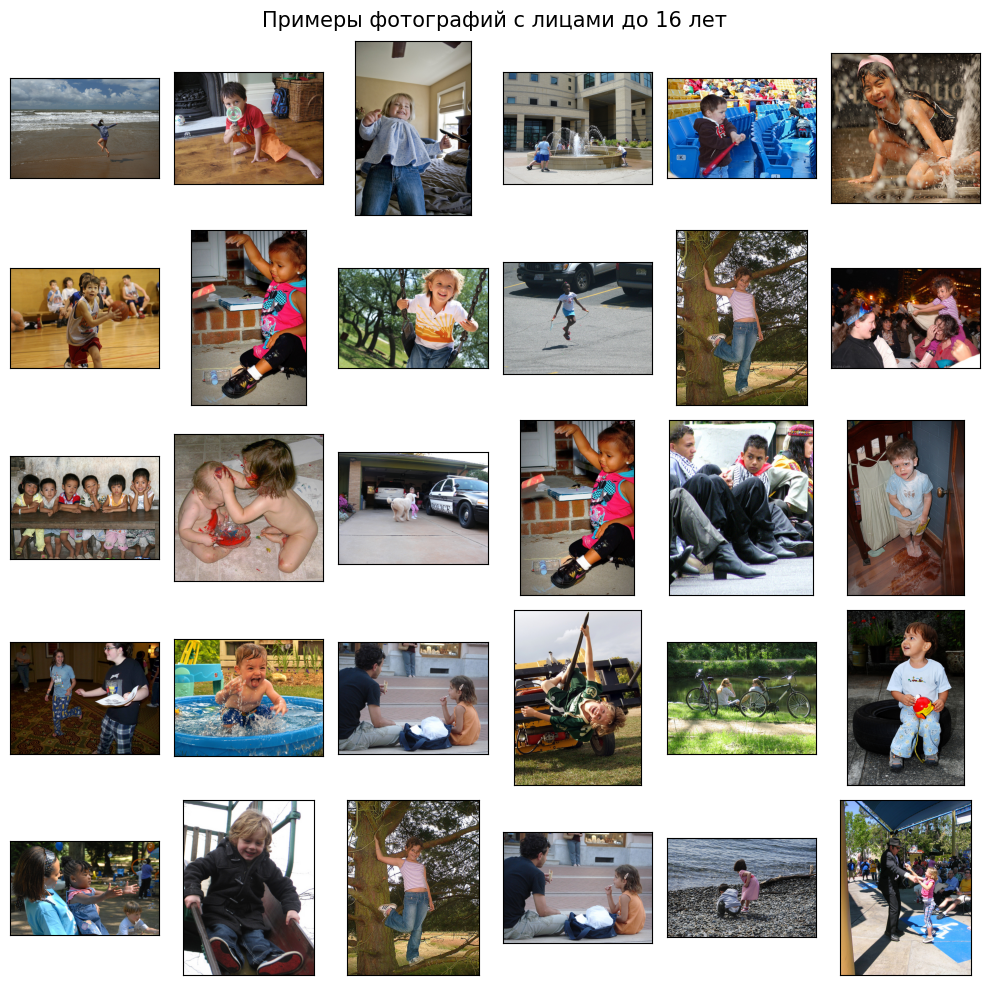

In [ ]:
open_image(sample=stop_photo, b=30, path=PATH, path2='train_images')

Судя по фотографиям, функция работает верно и отмечает изображения с лицами до 16 лет.

Отберем строки, в которых block равен 1, и извлечем query_id без двух последних символов, что и является именем изображения. Затем получим уникальные значения этих имен.

Потом удалим из датафрейма все строки, у которых query_id (без двух последних символов) содержится в списке плохих изображений.

In [ ]:
# Определим список плохих изображений
bad_image_ids = data_train[data_train['block'] == 1]['query_id'].apply(lambda x: x[:-2]).unique()

# Удалим из датасета все записи с плохими изображениями
data_train = data_train[~data_train['query_id'].str[:-2].isin(bad_image_ids)]
data_train.reset_index(inplace=True, drop=True)

In [ ]:
data_train.head()

,image,query_id,query_text,agg_score,block
0,1056338697_4f7d7ce270.jpg,3181701312_70a379ab6e.jpg#2,a man sleeps under a blanket on a city street .,0.000000,0
1,3187395715_f2940c2b72.jpg,3181701312_70a379ab6e.jpg#2,a man sleeps under a blanket on a city street .,0.333333,0
2,463978865_c87c6ca84c.jpg,3181701312_70a379ab6e.jpg#2,a man sleeps under a blanket on a city street .,0.333333,0
3,488590040_35a3e96c89.jpg,3181701312_70a379ab6e.jpg#2,a man sleeps under a blanket on a city street .,0.333333,0
4,534875358_6ea30d3091.jpg,3181701312_70a379ab6e.jpg#2,a man sleeps under a blanket on a city street .,0.000000,0


In [ ]:
data_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4263 entries, 0 to 4262
Data columns (total 5 columns):
 #   Column      Non-Null Count  Dtype  
---  ------      --------------  -----  
 0   image       4263 non-null   object 
 1   query_id    4263 non-null   object 
 2   query_text  4263 non-null   object 
 3   agg_score   4263 non-null   float64
 4   block       4263 non-null   int64  
dtypes: float64(1), int64(1), object(3)
memory usage: 166.6+ KB


### Вывод

На этапе исследовательского анализа данных и проверки данных:

* Были загружены датасеты
* Данные были проверены на наличие пропущенных значений и дубликатов
* Была добавлена колонка со средними оценками экспертов в диапазон от 0 до 1
* Удалены ненужные колонки из тренировочного датасета
* Тренировочный датасет был очищен от изображений и описаний, где есть изображения или описание лиц до 16 лет



## 3. Векторизация изображений

Перейдём к векторизации изображений.

Самый простой способ — прочесть изображение и превратить полученную матрицу в вектор. Такой способ нам не подходит: длина векторов может быть сильно разной, так как размеры изображений разные. Поэтому стоит обратиться к свёрточным сетям: они позволяют "выделить" главные компоненты изображений. Как это сделать? Нужно выбрать какую-либо архитектуру, например ResNet-18, посмотреть на слои и исключить полносвязные слои, которые отвечают за конечное предсказание. При этом можно загрузить модель данной архитектуры, предварительно натренированную на датасете ImageNet.

 Для векторизации изображений воспользуемся свёрточными сетями. Будем использовать ResNet-50.


* Вместо rescale, будем использовать preprocessing_function=preprocess_input.
* Поставим размер изображений 224x224, который соответствует обучению модели ResNet-50.
* Добавим shuffle=False

In [ ]:
# Создадим функции загрузчиков изображений
def load_train(path=PATH):
    train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
    train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=data_train,
        directory=Path(path, 'train_images'),
        x_col='image',
        y_col='agg_score',
        target_size=(224, 224),  #размер 224x224
        batch_size=16,
        class_mode='input',
        shuffle=False,  #данные не перемешиваются
        seed=SEED
    )
    return train_gen_flow

In [ ]:
flow_train = load_train()

Found 4263 validated image filenames.


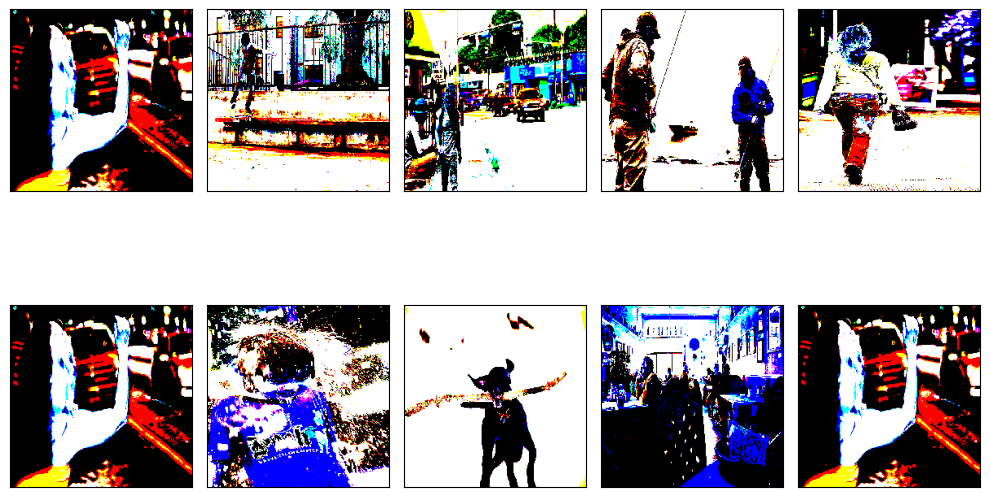

In [ ]:
features, target = next(flow_train)

fig = plt.figure(figsize=(10,10))
for i in range(10):
    fig.add_subplot(2, 5, i+1)
    plt.imshow(features[i])
    plt.xticks([])
    plt.yticks([])
    plt.tight_layout()
plt.show()

In [ ]:
# Создадим модель
def create_model():
    backbone = ResNet50(input_shape=(224, 224, 3),
                        weights='imagenet',
                        include_top=False)
    model = Sequential()
    model.add(backbone)
    model.add(GlobalAveragePooling2D())
    optimizer = Adam(learning_rate=1e-3)
    model.compile(optimizer=optimizer, loss='mean_squared_error',
                  metrics=['mean_absolute_error'])
    return model

model = create_model()

94765736/94765736 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


In [ ]:
# Сформируем эмбеддинги
def image_vectorization(model, data_gen):
    embeddings = []
    for i in range(len(data_gen)):
        images, _ = data_gen[i]
        preds = model.predict(images)
        embeddings.append(preds)
    # Объединим все батчи в один массив
    embeddings = np.vstack(embeddings)
    return embeddings

In [ ]:
# Получим эмбеддинги изображений
image_embeddings = image_vectorization(create_model(), flow_train)
print(image_embeddings.shape)

1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 5s 5s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 

## 4. Векторизация текстов

Следующий этап — векторизация текстов. Можно поэкспериментировать с несколькими способами векторизации текстов:

- tf-idf
- word2vec
- трансформеры (например, Bert)


Для векторизации тектов применим трансформер BERT

In [ ]:
# Загрузим модель и токенизатор BERT
model = BertModel.from_pretrained('bert-base-uncased')
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

# Проведем токенизацию текстов
tokenized = data_train['query_text'].apply(
    lambda x: tokenizer.encode(x, add_special_tokens=True, max_length=128, truncation=True))

max_len = max([len(i) for i in tokenized.values])
print(max_len)

padded = np.array([i + [0]*(max_len - len(i)) for i in tokenized.values])
attention_mask = np.where(padded != 0, 1, 0)

# Создадтм TensorDataset и DataLoader
batch_size = 32

dataset = TensorDataset(torch.tensor(padded), torch.tensor(attention_mask))
dataloader = DataLoader(dataset, batch_size=batch_size)

# Получим эмбеддинги с помощью модели bert-base-uncased (модель переведем в режим оценки)
model.eval()

embeddings = []

with torch.no_grad():
    for batch in dataloader:
        batch_inputs, batch_attention_mask = batch
        batch_embeddings = model(batch_inputs, attention_mask=batch_attention_mask)
        embeddings.append(batch_embeddings[0][:,0,:].cpu().numpy())

features_text = np.concatenate(embeddings)
print(features_text.shape)

/usr/local/lib/python3.10/dist-packages/huggingface_hub/utils/_token.py:89: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/570 [00:00<?, ?B/s]

model.safetensors:   0%|          | 0.00/440M [00:00<?, ?B/s]

tokenizer_config.json:   0%|          | 0.00/48.0 [00:00<?, ?B/s]

vocab.txt:   0%|          | 0.00/232k [00:00<?, ?B/s]

tokenizer.json:   0%|          | 0.00/466k [00:00<?, ?B/s]

36
(4263, 768)


## 5. Объединение векторов

Подготовим данные для обучения: объединим векторы изображений и векторы текстов с целевой переменной.

In [ ]:
features = np.concatenate((image_embeddings, features_text), axis=1)
print(features.shape)

(4263, 2816)


In [ ]:
target = np.array(data_train['agg_score'])
target.shape

(4263,)

## 6. Обучение модели предсказания соответствия

Для обучения разделим датасет на тренировочную и тестовую выборки. Простое случайное разбиение не подойдет: нужно исключить попадание изображения и в обучающую, и в тестовую выборки.
  
Для того чтобы учесть изображения при разбиении, можно воспользоваться классом [GroupShuffleSplit](https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GroupShuffleSplit.html) из библиотеки sklearn.model_selection.

Код ниже разбивает датасет на тренировочную и тестовую выборки в пропорции 7:3 так, что строки с одинаковым значением 'group_column' будут содержаться либо в тестовом, либо в тренировочном датасете.

```
from sklearn.model_selection import GroupShuffleSplit
gss = GroupShuffleSplit(n_splits=1, train_size=.7, random_state=42)
train_indices, test_indices = next(gss.split(X=df.drop(columns=['target']), y=df['target'], groups=df['group_column']))
train_df, test_df = df.loc[train_indices], df.loc[test_indices]

```

In [ ]:
# Разделим данные с учетом групп
gss = GroupShuffleSplit(n_splits=1, train_size=0.8, random_state=SEED)
train_indices, val_indices = next(gss.split(X=features, y=target, groups=data_train['image']))

# Создадим тренировочную и валидационную выбороки
features_train, features_val = features[train_indices], features[val_indices]
target_train, target_val = target[train_indices], target[val_indices]

# Нормализация данных
scaler = StandardScaler().fit(features_train)
X_train = scaler.transform(features_train)
X_val = scaler.transform(features_val)

print(X_train.shape, X_val.shape)
print(target_train.shape, target_val.shape)


(3424, 2816) (839, 2816)
(3424,) (839,)


В проекте предстоит решить задачу регрессии: предсказания соответствия текста и картинки.
Для этого обучим на тренировочной выборке две модели:

* LinearRegression
* Нейронную сеть TensorFlow/Keras с несколькими слоями полносвязных нейронов

В качестве метрики качества будем использовать **RMSE**

RMSE более чувствительна к большим отклонениям (выбросам), чем MAE. Это означает, что большие отклонения будут иметь больший вес при расчете метрики, что может быть важно для задач, где необходимо минимизировать крупные ошибки соответствия между текстом и изображением.

### LinearRegression и Ridge

Решаем новую задачу и не знаем, насколько хороши наши метрики и наши модели. Поэтому начнем с бейзлайна - константной модели (LinearRegression).

In [ ]:
# Обучим модель LinearRegression на тренировочной выборке
model_lr = LinearRegression()
model_lr.fit(X_train, target_train)

# Предскажем на валидационной выборке
predictions = model_lr.predict(X_val)

mse = mean_squared_error(target_val, predictions)
# Вычислим RMSE
rmse = np.sqrt(mse)
print(f'Root Mean Squared Error (RMSE): {rmse}')

Root Mean Squared Error (RMSE): 4171.8508662807135


Получили очень странный результат RMSE. Попробуем Ridge.

In [ ]:
model_r = Ridge()
model_r.fit(X_train, target_train)

predictions = model_r.predict(X_val)

mse = mean_squared_error(target_val, predictions)
# Вычисление RMSE
rmse = np.sqrt(mse)
print(f'Root Mean Squared Error (RMSE): {rmse}')

Root Mean Squared Error (RMSE): 0.34701694780652553


### Нейронная сеть

In [ ]:
# Модель нейронной сети
model_nn = Sequential([
    Dense(2816, activation='tanh', input_shape=(X_train.shape[1],)),
    BatchNormalization(),
    Dropout(0.4),
    Dense(128, activation='tanh'),
    BatchNormalization(),
    Dropout(0.4),
    Dense(64, activation='tanh'),
    BatchNormalization(),
    Dropout(0.4),
    Dense(1, activation='sigmoid')
])

optimizer = Adam(learning_rate=1e-5)

# Компиляция модели с MAE в качестве функции потерь
model_nn.compile(loss='mean_absolute_error',
                 optimizer=optimizer,
                 metrics=[tf.keras.metrics.RootMeanSquaredError()])

# Создадим коллбэк для ранней остановки
early_stopping = EarlyStopping(monitor='val_root_mean_squared_error', patience=10, verbose=1, mode='min')

# Обучим модель с использованием EarlyStopping
history = model_nn.fit(X_train,
                       target_train,
                       epochs=100,
                       batch_size=128,
                       validation_data=(X_val, target_val),
                       verbose=2,
                       callbacks=[early_stopping])

best_val_rmse = min(history.history['val_root_mean_squared_error'])
print(f"Best validation RMSE: {best_val_rmse}")

/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1/100
27/27 - 9s - 317ms/step - loss: 0.4074 - root_mean_squared_error: 0.4915 - val_loss: 0.3481 - val_root_mean_squared_error: 0.4042
Epoch 2/100
27/27 - 9s - 320ms/step - loss: 0.3917 - root_mean_squared_error: 0.4805 - val_loss: 0.3418 - val_root_mean_squared_error: 0.4045
Epoch 3/100
27/27 - 5s - 203ms/step - loss: 0.3868 - root_mean_squared_error: 0.4777 - val_loss: 0.3384 - val_root_mean_squared_error: 0.4086
Epoch 4/100
27/27 - 4s - 162ms/step - loss: 0.3799 - root_mean_squared_error: 0.4724 - val_loss: 0.3357 - val_root_mean_squared_error: 0.4135
Epoch 5/100
27/27 - 5s - 182ms/step - loss: 0.3756 - root_mean_squared_error: 0.4684 - val_loss: 0.3342 - val_root_mean_squared_error: 0.4188
Epoch 6/100
27/27 - 6s - 218ms/step - loss: 0.3724 - root_mean_squared_error: 0.4667 - val_loss: 0.3336 - val_root_mean_squared_error: 0.4237
Epoch 7/100
27/27 - 4s - 158ms/step - loss: 0.3714 - root_mean_squared_error: 0.4658 - val_loss: 0.3327 - val_root_mean_squared_error: 0.4270
Epoch 

### Вывод

На этапе подготовки данных для обучения:

* Перевели в вектора изображения, используя свёрточную сеть ResNet-50.
* Для векторизации тектов применили BERT
* Объедините векторы изображений и векторы текстов с целевой переменной.

* Разделили датасет на тренировочную и тестовую выборки. Для разбиения использовали GroupShuffleSplit из библиотеки sklearn.model_selection.

* Обучили на тренировочной выборке две модели, в качестве метрики использовали RMSE:

    * LinearRegression
    * Ridge
    * Нейронную сеть TensorFlow/Keras с несколькими слоями полносвязных нейронов

Модель Ridge показала лучший результат RMSE 0.35. Ее будем использовать при тестировании модели.

## 7. Тестирование модели

Настало время протестировать модель. Для этого получите эмбеддинги для всех тестовых изображений из папки `test_images`, выберите случайные 10 запросов из файла `test_queries.csv` и для каждого запроса выведите наиболее релевантное изображение. Сравните визуально качество поиска.

Создадим вектора тестовых изображений

In [ ]:
df_image = pd.DataFrame(data_test.image.unique(), columns=['image'])
print(len(df_image))

100


In [ ]:
# Создадим функцию загрузчика изображений
def load_test(path=PATH):
    train_datagen = ImageDataGenerator(preprocessing_function=preprocess_input)
    train_gen_flow = train_datagen.flow_from_dataframe(
        dataframe=test_image,
        directory=Path(path, 'test_images'),
        x_col='image',
        y_col=None,
        target_size=(224, 224),
        batch_size=16,
        class_mode='input',
        shuffle=False,
        seed=SEED
    )
    return train_gen_flow

In [ ]:
# Векторизация изображений
image_embeddings_test = image_vectorization(create_model(), load_test())

Found 100 validated image filenames.
1/1 ━━━━━━━━━━━━━━━━━━━━ 4s 4s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


In [ ]:
image_embeddings_test.shape

(100, 2048)

Получим вектора уникальных описаний картинок из тестовго датасета

In [ ]:
def get_embed(data, model, tokenizer):
    tokenized = [tokenizer.encode(x, add_special_tokens=True, max_length=128, truncation=True) for x in data]
    max_len = max([len(i) for i in tokenized])
    padded = np.array([i + [0]*(max_len - len(i)) for i in tokenized])
    attention_mask = np.where(padded != 0, 1, 0)
    embeddings_text = []
    batch = torch.LongTensor(padded)
    attention_mask_batch = torch.LongTensor(attention_mask)
    with torch.no_grad():
        batch_embeddings = model(batch, attention_mask=attention_mask_batch)
    embeddings_text.append(batch_embeddings[0][:,0,:].cpu().numpy())
    return embeddings_text

Напишем функцию, принимающую на вход текстовое описание и возвращающую 5 похожих картинок


 A woman walks and a little boy walks to the side of her . 
 This image is unavailable in your country in compliance with local laws. 


 A dog is jumping into a pool for a swim competition 



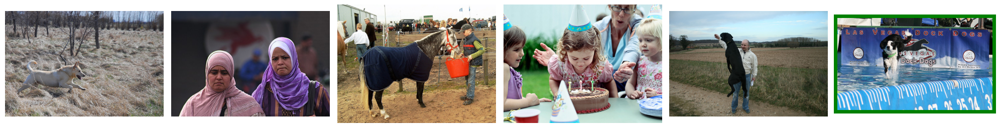


 Closeup of a man at an event with formal attire . 



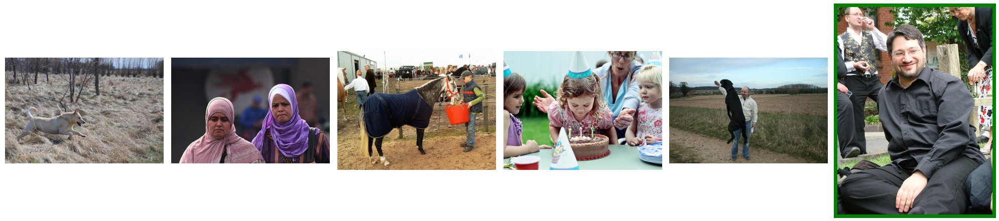


 A group of people in a large yard toss a disc . 



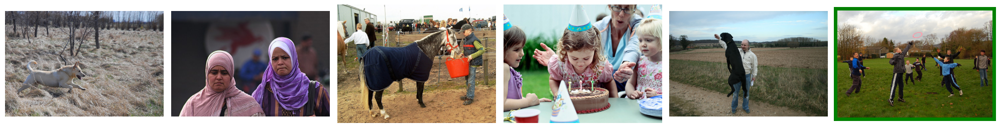


 a couple each wearing a silly mask and holding a fake cigar 



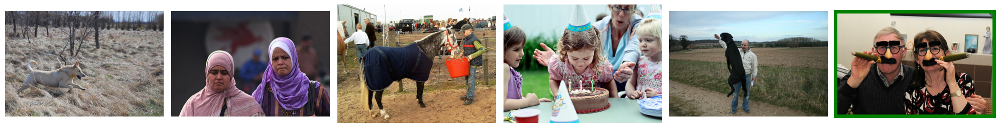


 A young boy jumps his bicycle on a tagged bike ramp . 
 This image is unavailable in your country in compliance with local laws. 


 Two people in a tent near a rock wall . 



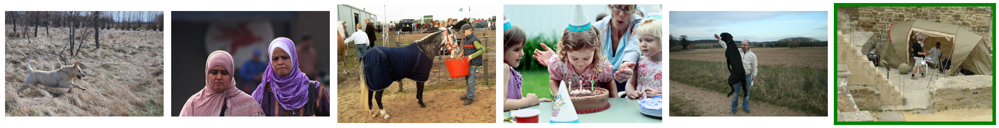


 A race car kicks up dirt and dust on a gravel track . 



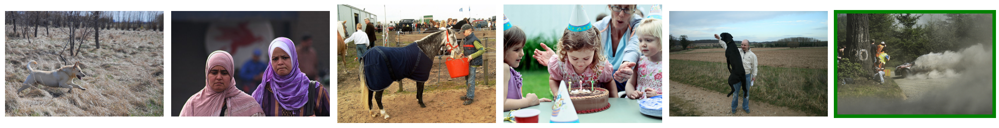


 kids are playing in water fountains 
 This image is unavailable in your country in compliance with local laws. 


 I child slides into a wading pool full of water while an adult tosses a bucket of water on them . 
 This image is unavailable in your country in compliance with local laws. 



In [ ]:
# Функция для получения изображения по текстовому запросу
def get_picture(text):
    text_split = text.split()
    if any(word in text_split for word in STOP_WORDS):
        print('\n', text, '\n', 'This image is unavailable in your country in compliance with local laws.', '\n')
    else:
        text_embed = get_embed(data=[text], model=model, tokenizer=tokenizer)
        text_embed = np.array(text_embed)
        # Преобразуем text_embed в 2D массив
        text_embed = text_embed.reshape(1, -1)
        # Повторим текстовый эмбеддинг для каждого изображения
        text_embed = np.repeat(text_embed, image_embeddings_test.shape[0], axis=0)

        # Объединим эмбеддинги изображений с текстом
        X = np.hstack((image_embeddings_test, text_embed))
        X = scaler.transform(X)

        # Получим предсказания
        predictions = model_r.predict(X)

        df = pd.concat([df_image, pd.Series(predictions, name='pred')], axis=1)
        top = list(df.sort_values(by='pred', ascending=False)['image'].head(5))

        print('\n', text, '\n')

        fig = plt.figure(figsize=(20, 5))
        plt.rcParams['axes.edgecolor'] = 'black'
        plt.rcParams['axes.linewidth'] = 0
        for i in range(len(top)):
            fig.add_subplot(1, 6, i+1)
            image_path = Path(PATH, 'test_images', top[i])
            image = Image.open(image_path).convert('RGB')
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()

        if text in list(data_test['query_text']):
            plt.rcParams['axes.edgecolor'] = 'green'
            plt.rcParams['axes.linewidth'] = 5
            fig.add_subplot(1, 6, 6)
            image_path = Path(PATH, 'test_images', data_test[data_test['query_text'] == text]['image'].iloc[0])
            image = Image.open(image_path).convert('RGB')
            plt.imshow(image)
            plt.xticks([])
            plt.yticks([])
            plt.tight_layout()
        plt.show()

# Примеры текстов для тестирования
samples = data_test.sample(10)
text_test = list(samples['query_text'])

# Предсказание для каждого текста в тестовых данных
for text in text_test:
    get_picture(text)

Функция принимают на вход текст и находит изображения, отбрасывая изображения лиц младше 16. Но, к сожалению, предсказывает картинки некорректно. Возможно, на этапе векторизации были допущены ошибки или подобран неточный метод, или нужно было тестировать другие модели с тщательным подбором гиперпараметров.

# Вывод

На этапе тестирования модели:

* Перевели в вектора изображения и тексты из тестового датасета.
* Напиcали функцию, принимающую на вход текстовое описание и возвращающую 5 похожих картинок
* Выбрали случайные 10 запросов из файла test_queries.csv и для каждого запроса вывели наиболее релевантное изображение
* Провели визуальное сравнение качества поиска

Функция принимает на вход текст и находит изображения, отбрасывая изображения лиц младше 16. Но, к сожалению, предсказывает картинки некорректно.

Рекомендации для улучшения качества модели:

* Проверить этапы векторизации текстов и изображений
* Протестировать использованные модели с другими гиперпараметрами
* Протестировать другие модели/нейронные сети с тщательным подбором гиперпараметров.